# Import Packages and Data

Source: https://www.kaggle.com/datasets/noordeen/insurance-premium-prediction

In [137]:
using CSV, DataFrames, Turing, MLJ, StatsPlots, Distributions, StatsBase, LinearAlgebra, FillArrays

In [2]:
df = DataFrame(CSV.File("dataset.csv"))

Row,age,sex,bmi,children,smoker,region,charges
,Int64,String7,Float64,Int64,String3,String15,Float64
1,19,female,27.9,0,yes,southwest,16884.9
2,18,male,33.77,1,no,southeast,1725.55
3,28,male,33.0,3,no,southeast,4449.46
4,33,male,22.705,0,no,northwest,21984.5
5,32,male,28.88,0,no,northwest,3866.86
6,31,female,25.74,0,no,southeast,3756.62
7,46,female,33.44,1,no,southeast,8240.59
8,37,female,27.74,3,no,northwest,7281.51
9,37,male,29.83,2,no,northeast,6406.41


In [3]:
first(df, 5)

Row,age,sex,bmi,children,smoker,region,charges
,Int64,String7,Float64,Int64,String3,String15,Float64
1,19,female,27.9,0,yes,southwest,16884.9
2,18,male,33.77,1,no,southeast,1725.55
3,28,male,33.0,3,no,southeast,4449.46
4,33,male,22.705,0,no,northwest,21984.5
5,32,male,28.88,0,no,northwest,3866.86


In [4]:
[name => eltype(df[!, name]) for name in names(df)]

7-element Vector{Pair{String, DataType}}:
      "age" => Int64
      "sex" => String7
      "bmi" => Float64
 "children" => Int64
   "smoker" => String3
   "region" => String15
  "charges" => Float64

In [5]:
na_msg = any(any.(ismissing, eachcol(df))) ? "have" : "do not have"
println("The dataset $(na_msg) missing values; number of missing values = $(sum(sum.(ismissing, eachcol(df))))")

The dataset do not have missing values; number of missing values = 0


In [6]:
describe(df)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,age,39.207,18,39.0,64,0,Int64
2,sex,,female,,male,0,String7
3,bmi,30.6634,15.96,30.4,53.13,0,Float64
4,children,1.09492,0,1.0,5,0,Int64
5,smoker,,no,,yes,0,String3
6,region,,northeast,,southwest,0,String15
7,charges,13270.4,1121.87,9382.03,63770.4,0,Float64


# Data Visualisation

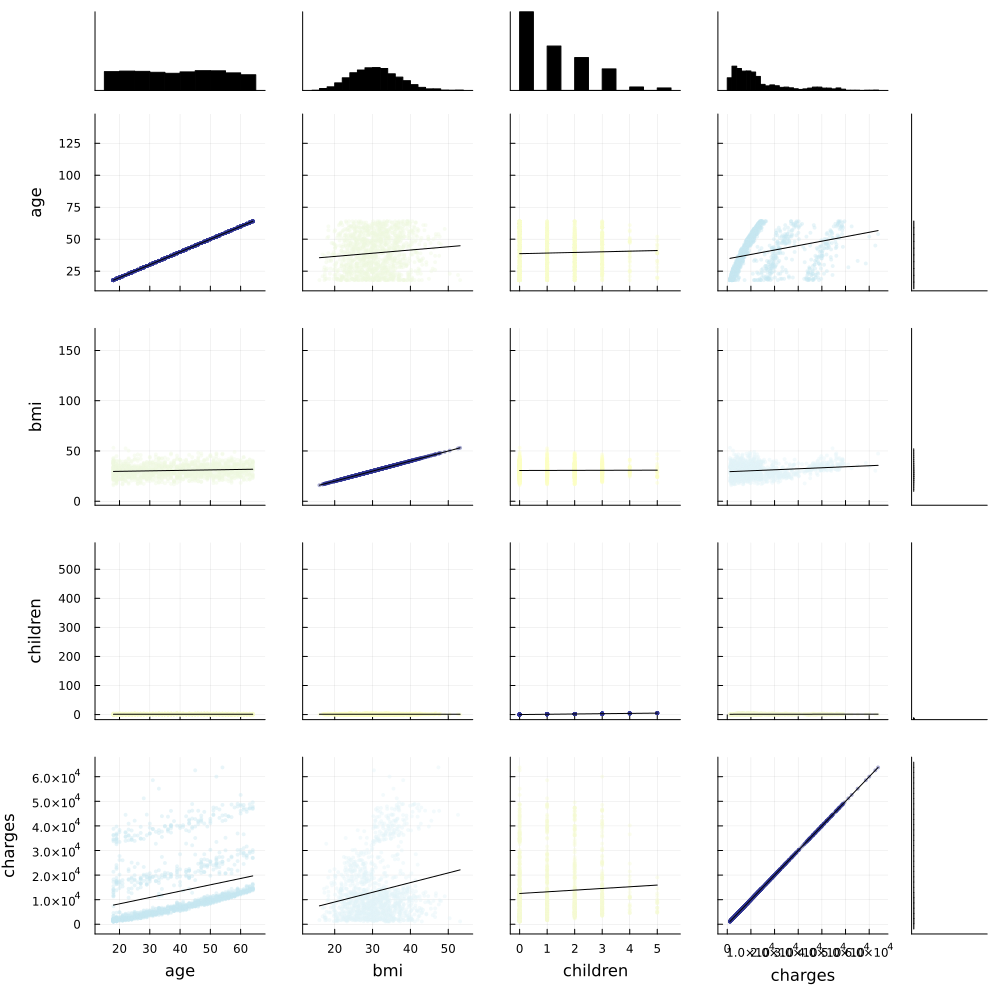

In [7]:
gr(size = (1000, 1000))
@df df cornerplot([:age :bmi :children :charges])

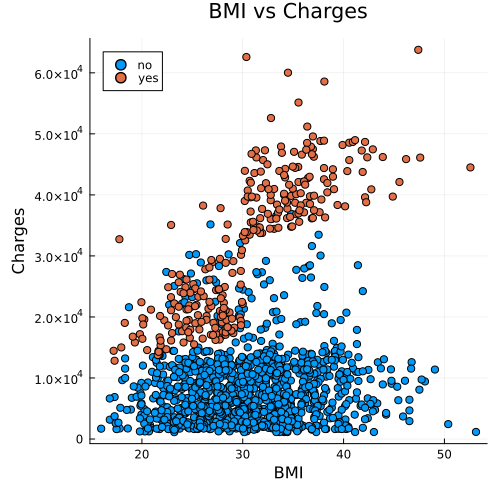

In [8]:
gr(size = (500, 500))
@df df scatter(:bmi, :charges, group = :smoker)
title!("BMI vs Charges")
xlabel!("BMI")
ylabel!("Charges")

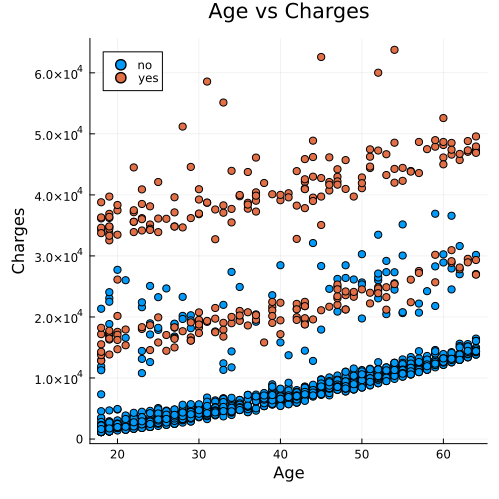

In [9]:
gr(size = (500, 500))
@df df scatter(:age, :charges, group = :smoker)
title!("Age vs Charges")
xlabel!("Age")
ylabel!("Charges")

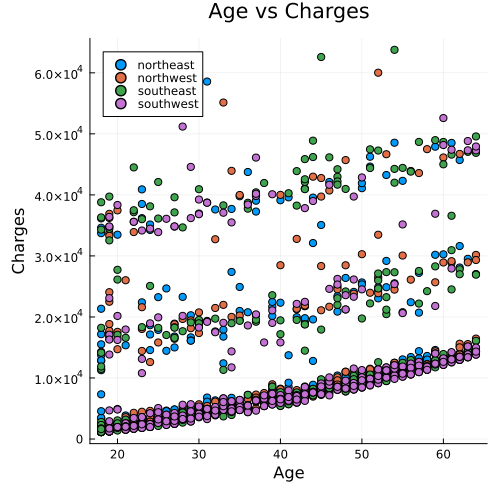

In [10]:
gr(size = (500, 500))
@df df scatter(:age, :charges, group = :region)
title!("Age vs Charges")
xlabel!("Age")
ylabel!("Charges")

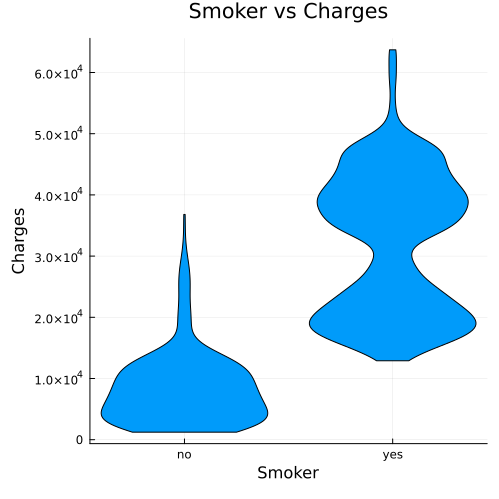

In [11]:
@df df violin(:smoker, :charges, legend=false)
title!("Smoker vs Charges")
xlabel!("Smoker")
ylabel!("Charges")

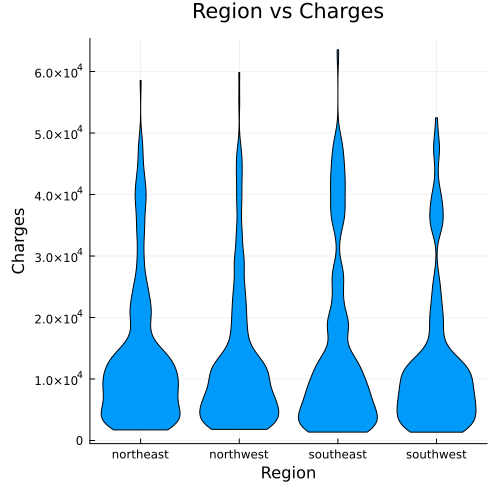

In [12]:
@df df violin(:region, :charges, legend=false)
title!("Region vs Charges")
xlabel!("Region")
ylabel!("Charges")

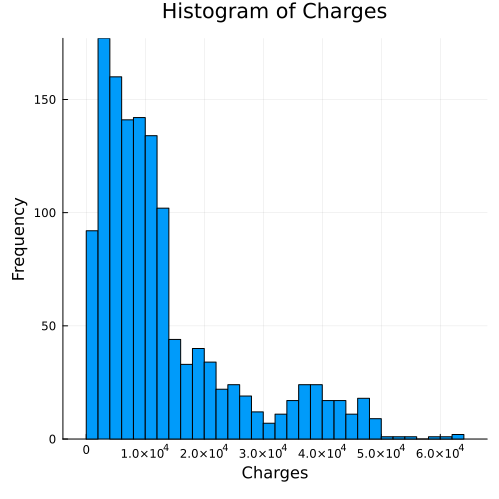

In [13]:
@df df histogram(:charges, bins=50, xlabel="Charges", ylabel="Frequency", title="Histogram of Charges", legend=false)

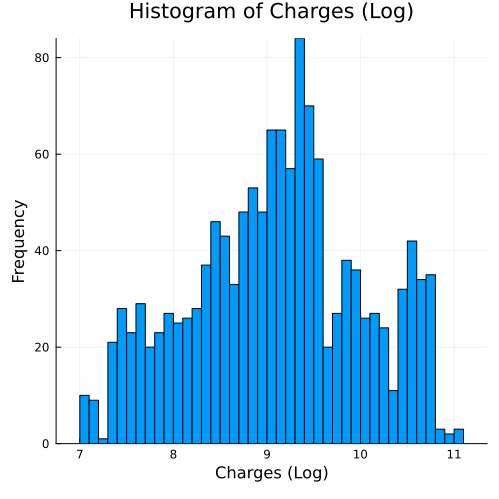

In [15]:
histogram(log.(df.charges), bins=50, xlabel="Charges (Log)", ylabel="Frequency", title="Histogram of Charges (Log)", legend=false)

# Feature Engineering

In [63]:
MLJ.schema(df)

┌──────────┬────────────┬──────────┐
│ names    │ scitypes   │ types    │
├──────────┼────────────┼──────────┤
│ age      │ Count      │ Int64    │
│ sex      │ Textual    │ String7  │
│ bmi      │ Continuous │ Float64  │
│ children │ Count      │ Int64    │
│ smoker   │ Textual    │ String3  │
│ region   │ Textual    │ String15 │
│ charges  │ Continuous │ Float64  │
└──────────┴────────────┴──────────┘


In [67]:
coerce!(df, :age => MLJ.Continuous, :bmi => MLJ.Continuous, :children => MLJ.Count, 
        :charges => MLJ.Continuous, :smoker => MLJ.Multiclass, :region => MLJ.Multiclass, :sex => MLJ.Multiclass)

Row,age,sex,bmi,children,smoker,region,charges
,Float64,Cat…,Float64,Int64,Cat…,Cat…,Float64
1,19.0,female,27.9,0,yes,southwest,16884.9
2,18.0,male,33.77,1,no,southeast,1725.55
3,28.0,male,33.0,3,no,southeast,4449.46
4,33.0,male,22.705,0,no,northwest,21984.5
5,32.0,male,28.88,0,no,northwest,3866.86
6,31.0,female,25.74,0,no,southeast,3756.62
7,46.0,female,33.44,1,no,southeast,8240.59
8,37.0,female,27.74,3,no,northwest,7281.51
9,37.0,male,29.83,2,no,northeast,6406.41


In [68]:
hot = OneHotEncoder(drop_last=true)

OneHotEncoder(
  features = Symbol[], 
  drop_last = true, 
  ordered_factor = true, 
  ignore = false)

In [69]:
mach = fit!(machine(hot, df))

┌ Info: Training machine(OneHotEncoder(features = Symbol[], …), …).
└ @ MLJBase /Users/alex/.julia/packages/MLJBase/7nGJF/src/machines.jl:499
┌ Info: Spawning 1 sub-features to one-hot encode feature :sex.
└ @ MLJModels /Users/alex/.julia/packages/MLJModels/8W54X/src/builtins/Transformers.jl:795
┌ Info: Spawning 1 sub-features to one-hot encode feature :smoker.
└ @ MLJModels /Users/alex/.julia/packages/MLJModels/8W54X/src/builtins/Transformers.jl:795
┌ Info: Spawning 3 sub-features to one-hot encode feature :region.
└ @ MLJModels /Users/alex/.julia/packages/MLJModels/8W54X/src/builtins/Transformers.jl:795


trained Machine; caches model-specific representations of data
  model: OneHotEncoder(features = Symbol[], …)
  args: 
    1:	Source @484 ⏎ Table{Union{AbstractVector{ScientificTypesBase.Continuous}, AbstractVector{Count}, AbstractVector{Multiclass{2}}, AbstractVector{Multiclass{4}}}}


In [70]:
df_clean = MLJ.transform(mach, df)

Row,age,sex__female,bmi,children,smoker__no,region__northeast,region__northwest,region__southeast,charges
,Float64,Float64,Float64,Int64,Float64,Float64,Float64,Float64,Float64
1,19.0,1.0,27.9,0,0.0,0.0,0.0,0.0,16884.9
2,18.0,0.0,33.77,1,1.0,0.0,0.0,1.0,1725.55
3,28.0,0.0,33.0,3,1.0,0.0,0.0,1.0,4449.46
4,33.0,0.0,22.705,0,1.0,0.0,1.0,0.0,21984.5
5,32.0,0.0,28.88,0,1.0,0.0,1.0,0.0,3866.86
6,31.0,1.0,25.74,0,1.0,0.0,0.0,1.0,3756.62
7,46.0,1.0,33.44,1,1.0,0.0,0.0,1.0,8240.59
8,37.0,1.0,27.74,3,1.0,0.0,1.0,0.0,7281.51
9,37.0,0.0,29.83,2,1.0,1.0,0.0,0.0,6406.41


In [72]:
df_clean.charges = log.(df_clean.charges)

1338-element Vector{Float64}:
  9.734176431773115
  7.453302452133774
  8.400538468975023
  9.998091601725266
  8.260196845858372
  8.231275321843
  9.016827173741753
  8.893092932994646
  8.765054439884247
 10.272397139270046
  ⋮
  9.242343369204054
  9.44376414823737
  9.286925169193296
  9.342393109428775
  9.268661005177488
  7.698927496239761
  7.39623314134416
  7.604867089998248
 10.279913760197052

In [248]:
y, X =  unpack(df_clean, ==(:charges); rng=123)

([9.467211971648577, 10.623694340922153, 9.518366744845707, 9.444984655610234, 8.577755665419184, 10.183657631860399, 8.522806726007444, 9.116227255405688, 9.98023478794707, 10.76841118624667  …  10.589801791631476, 8.954200505687611, 9.338142664603124, 9.136708847841536, 8.671890076332048, 9.41177915783591, 9.059148553730727, 8.87536456115119, 9.476338974230188, 7.443620235711848], 1338×8 DataFrame
  Row │ age      sex__female  bmi      children  smoker__no  region__northeast ⋯
      │ Float64  Float64      Float64  Int64     Float64     Float64           ⋯
──────┼─────────────────────────────────────────────────────────────────────────
    1 │    59.0          0.0   31.79          2         1.0                0.0 ⋯
    2 │    50.0          0.0   31.825         0         0.0                1.0
    3 │    58.0          1.0   31.825         2         1.0                1.0
    4 │    60.0          1.0   35.1           0         1.0                0.0
    5 │    28.0          1.0   26.31

In [249]:
(Xmain, Xtest), (ymain, ytest) = partition((X, y), 0.9, rng=123, multi=true)

((1204×8 DataFrame
  Row │ age      sex__female  bmi      children  smoker__no  region__northeast ⋯
      │ Float64  Float64      Float64  Int64     Float64     Float64           ⋯
──────┼─────────────────────────────────────────────────────────────────────────
    1 │    31.0          0.0   31.065         3         1.0                0.0 ⋯
    2 │    18.0          1.0   39.82          0         1.0                0.0
    3 │    43.0          0.0   30.115         3         1.0                0.0
    4 │    64.0          0.0   25.6           2         1.0                0.0
    5 │    63.0          0.0   28.31          0         1.0                0.0 ⋯
    6 │    50.0          1.0   31.6           2         1.0                0.0
    7 │    28.0          1.0   28.88          1         1.0                1.0
    8 │    19.0          1.0   25.745         1         1.0                0.0
  ⋮   │    ⋮          ⋮          ⋮        ⋮          ⋮               ⋮         ⋱
 1198 │    41.0      

In [250]:
(Xtrain, Xvalid), (ytrain, yvalid) = partition((Xmain, ymain), 0.9, rng=123, multi=true)

((1084×8 DataFrame
  Row │ age      sex__female  bmi      children  smoker__no  region__northeast ⋯
      │ Float64  Float64      Float64  Int64     Float64     Float64           ⋯
──────┼─────────────────────────────────────────────────────────────────────────
    1 │    39.0          0.0   42.655         0         1.0                1.0 ⋯
    2 │    45.0          0.0   23.56          2         1.0                1.0
    3 │    60.0          0.0   39.9           0         0.0                0.0
    4 │    31.0          1.0   25.74          0         1.0                0.0
    5 │    21.0          0.0   31.02          0         1.0                0.0 ⋯
    6 │    29.0          0.0   31.73          2         1.0                0.0
    7 │    36.0          0.0   34.43          2         1.0                0.0
    8 │    27.0          1.0   21.47          0         1.0                0.0
  ⋮   │    ⋮          ⋮          ⋮        ⋮          ⋮               ⋮         ⋱
 1078 │    46.0      

In [251]:
ss = Standardizer(features=[:age, :bmi, :children])
ssm = fit!(machine(ss, Xtrain))
Xtrain = MLJ.transform(ssm, Xtrain)
Xvalid = MLJ.transform(ssm, Xvalid)
Xtest = MLJ.transform(ssm, Xtest)

┌ Info: Training machine(Standardizer(features = [:age, :bmi, :children], …), …).
└ @ MLJBase /Users/alex/.julia/packages/MLJBase/7nGJF/src/machines.jl:499


Row,age,sex__female,bmi,children,smoker__no,region__northeast,region__northwest,region__southeast
,Float64,Float64,Float64,Int64,Float64,Float64,Float64,Float64
1,0.542923,1.0,-1.02242,0,1.0,1.0,0.0,0.0
2,-0.526221,0.0,-0.0874345,1,1.0,0.0,0.0,1.0
3,0.186541,0.0,0.857375,2,1.0,0.0,0.0,0.0
4,-0.74005,1.0,-0.742415,0,1.0,0.0,1.0,0.0
5,-0.241116,1.0,-0.105446,1,1.0,0.0,0.0,1.0
6,-1.09643,1.0,-0.104628,0,1.0,0.0,1.0,0.0
7,1.54079,0.0,2.10184,0,1.0,0.0,0.0,0.0
8,1.75462,0.0,1.40756,1,1.0,0.0,0.0,1.0
9,-0.597498,0.0,-0.322409,1,1.0,0.0,1.0,0.0


# Linear Regression

In [190]:
@model function lr(X, y)
    nfeatures = size(X, 2)
    α ~ Normal(0, 1)
    β ~ MvNormal(Zeros(nfeatures), I)
    μ = α .+ X * β
    σ ~ Exponential(1)
    y ~ MvNormal(μ, σ * I)
end

lr (generic function with 2 methods)

In [191]:
chain = sample(lr(Matrix(Xtrain), ytrain), NUTS(), MCMCThreads(), 1000, 2; progress=false)

┌ Warning: Only a single thread available: MCMC chains are not sampled in parallel
└ @ AbstractMCMC /Users/alex/.julia/packages/AbstractMCMC/FSyVk/src/sample.jl:382
┌ Info: Found initial step size
│   ϵ = 0.0125
└ @ Turing.Inference /Users/alex/.julia/packages/Turing/Z4MFH/src/mcmc/hmc.jl:207
┌ Info: Found initial step size
│   ϵ = 0.00625
└ @ Turing.Inference /Users/alex/.julia/packages/Turing/Z4MFH/src/mcmc/hmc.jl:207


Chains MCMC chain (1000×22×2 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 2
Samples per chain = 1000
Wall duration     = 3.81 seconds
Compute duration  = 3.44 seconds
parameters        = α, β[1], β[2], β[3], β[4], β[5], β[6], β[7], β[8], σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std      mcse    ess_bulk    ess_tail      rhat   ⋯
      Symbol   Float64   Float64   Float64     Float64     Float64   Float64   ⋯

           α   10.1205    0.0418    0.0011   1377.7629   1376.2763    1.0022   ⋯
        β[1]    0.4857    0.0134    0.0003   2401.5511   1601.2670    1.0100   ⋯
        β[2]    0.0806    0.0261    0.0006   1934.7356   1585.1502    1.0055   ⋯
        β[3]    0.0863    0.0141    0.0003   2230.0750   1150.7595    1.0017   ⋯
        β[4]    0.1105

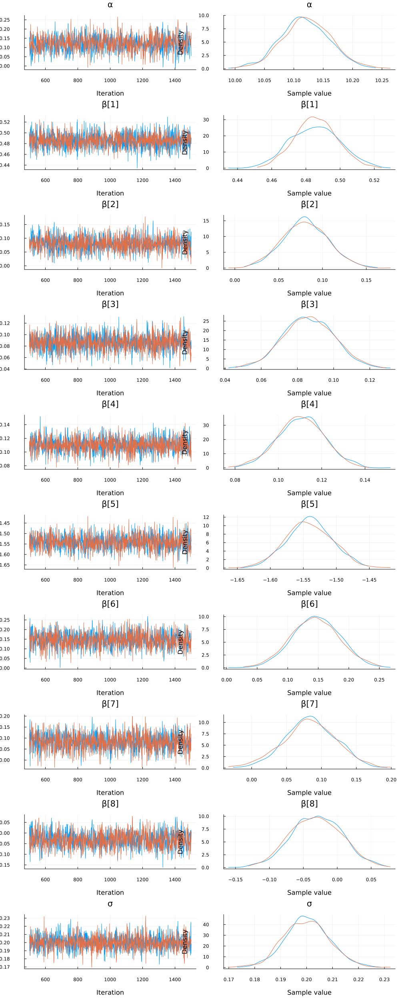

In [192]:
plot(chain)

In [193]:
p = get_params(chain[500:end, :, :])

(α = [10.14738986089929 10.1751307049056; 10.092505085255405 10.094031826364118; … ; 10.086397490568087 10.17958698897951; 10.055198480929347 10.144540228636458],
 hamiltonian_energy = [732.2943819694211 733.300905067943; 737.9646584862311 730.4254538455308; … ; 729.2214761274624 738.755584089946; 728.6881074879648 733.4106218890394],
 n_steps = [15.0 31.0; 15.0 31.0; … ; 15.0 7.0; 15.0 7.0],
 numerical_error = [0.0 0.0; 0.0 0.0; … ; 0.0 0.0; 0.0 0.0],
 max_hamiltonian_energy_error = [2.1982256573312497 0.2196667022932388; 0.4218920365898384 0.2483513268674642; … ; -0.20582723249810897 -0.3364023667439824; 0.7039812297376784 0.3329224281644656],
 hamiltonian_energy_error = [-1.1673260224565638 -0.01688198155363807; 0.13237851622511698 0.06807307780513838; … ; -0.0813616013202818 -0.13264867792508994; 0.3706231278820269 -0.08941856409865068],
 σ = [0.19438573167226333 0.1942671699448828; 0.18185183941457597 0.20118377849743727; … ; 0.1865389332948449 0.2036836519754047; 0.19867293236158

# Posterior Predictive Mean

In [235]:
function prediction(chain, X)
    p = get_params(chain[500:end, :, :])
    targets = reshape(vec(hcat(p.α)), 1, :) .+ Matrix(Xvalid) * mapreduce(permutedims, vcat, [vec(hcat(i)) for i in p.β])
    return vec(mean(targets, dims=2))
end

prediction (generic function with 1 method)

In [236]:
ypred = prediction(chain, Xvalid)

120-element Vector{Float64}:
  8.98645949293673
  8.135718690612833
  8.648341157165502
  8.628940163829363
  9.538331913239938
  8.496395195843341
  9.033015030026458
 10.529099779878448
  8.30656065036016
  8.300481246969905
  ⋮
  9.256132076990099
  7.9298881192484565
  9.006239121318943
  9.028340543835341
  8.74066401216298
  8.589124898024236
  9.216154829050286
  8.551791970828747
  8.401167025654363

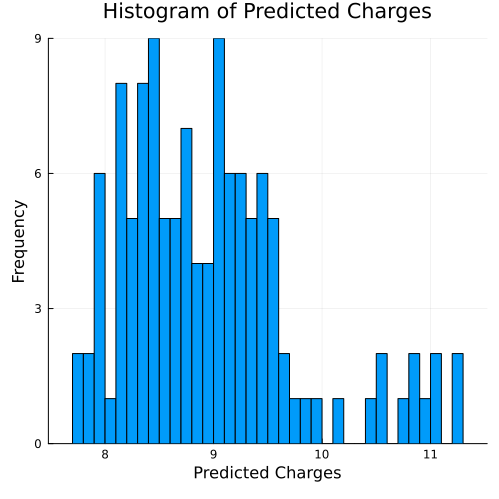

In [237]:
histogram(ypred, bins=50, xlabel="Predicted Charges", ylabel="Frequency", title="Histogram of Predicted Charges", legend=false)

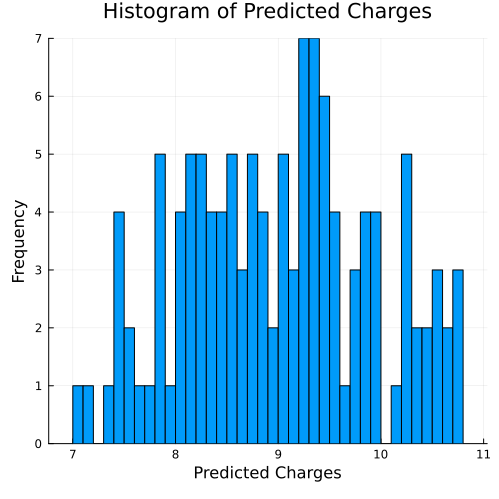

In [238]:
histogram(yvalid, bins=50, xlabel="Predicted Charges", ylabel="Frequency", title="Histogram of Predicted Charges", legend=false)

In [239]:
msd(ypred, yvalid)

0.2631680856685507

# Hierarchical Model

In [252]:
Xtrain

Row,age,sex__female,bmi,children,smoker__no,region__northeast,region__northwest,region__southeast
,Float64,Float64,Float64,Int64,Float64,Float64,Float64,Float64
1,-0.0272875,0.0,1.97985,0,1.0,1.0,0.0,0.0
2,0.40037,0.0,-1.14687,2,1.0,1.0,0.0,0.0
3,1.46951,0.0,1.52873,0,0.0,0.0,0.0,0.0
4,-0.597498,1.0,-0.789901,0,1.0,0.0,0.0,1.0
5,-1.31026,0.0,0.0746732,0,1.0,0.0,0.0,1.0
6,-0.74005,0.0,0.190932,2,1.0,0.0,1.0,0.0
7,-0.241116,0.0,0.633044,2,1.0,0.0,0.0,1.0
8,-0.882603,1.0,-1.48909,0,1.0,0.0,1.0,0.0
9,1.61207,0.0,-0.0890719,0,1.0,0.0,1.0,0.0


In [253]:
# no smoker = 1, smoker = 2

Xtrain_smoker = 2 .- Xtrain.smoker__no

1084-element Vector{Float64}:
 1.0
 1.0
 2.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 ⋮
 1.0
 1.0
 1.0
 2.0
 1.0
 1.0
 2.0
 1.0
 1.0

In [255]:
Xtrain1 = select(Xtrain, Not(:smoker__no))

Row,age,sex__female,bmi,children,region__northeast,region__northwest,region__southeast
,Float64,Float64,Float64,Int64,Float64,Float64,Float64
1,-0.0272875,0.0,1.97985,0,1.0,0.0,0.0
2,0.40037,0.0,-1.14687,2,1.0,0.0,0.0
3,1.46951,0.0,1.52873,0,0.0,0.0,0.0
4,-0.597498,1.0,-0.789901,0,0.0,0.0,1.0
5,-1.31026,0.0,0.0746732,0,0.0,0.0,1.0
6,-0.74005,0.0,0.190932,2,0.0,1.0,0.0
7,-0.241116,0.0,0.633044,2,0.0,0.0,1.0
8,-0.882603,1.0,-1.48909,0,0.0,1.0,0.0
9,1.61207,0.0,-0.0890719,0,0.0,1.0,0.0


In [300]:
@model function hm(X, y, smoker)
    nsmokers = length(unique(smoker))
    nfeatures = size(X, 2)
    μₐ ~ Normal(9, 3)
    σₐ ~ InverseGamma(1, 1)
    μᵦ ~ MvNormal(Zeros(nfeatures), I)
    αₛ ~ filldist(Normal(μₐ, σₐ), nsmokers)
    βₛ ~ MvNormal(μᵦ, I)
    μ = αₛ[smoker] .+ X * βₛ
    σ ~ InverseGamma(1, 1)
    y ~ MvNormal(μ, σ * I)
end

hm (generic function with 2 methods)

In [301]:
chain = sample(hm(Matrix(Xtrain1), ytrain, Int32.(Xtrain_smoker)), NUTS(), MCMCThreads(), 2000, 2; progress=false)

┌ Warning: Only a single thread available: MCMC chains are not sampled in parallel
└ @ AbstractMCMC /Users/alex/.julia/packages/AbstractMCMC/FSyVk/src/sample.jl:382
┌ Info: Found initial step size
│   ϵ = 0.00625
└ @ Turing.Inference /Users/alex/.julia/packages/Turing/Z4MFH/src/mcmc/hmc.jl:207
┌ Info: Found initial step size
│   ϵ = 0.00625
└ @ Turing.Inference /Users/alex/.julia/packages/Turing/Z4MFH/src/mcmc/hmc.jl:207


Chains MCMC chain (2000×31×2 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 2
Samples per chain = 2000
Wall duration     = 17.94 seconds
Compute duration  = 16.99 seconds
parameters        = μₐ, σₐ, μᵦ[1], μᵦ[2], μᵦ[3], μᵦ[4], μᵦ[5], μᵦ[6], μᵦ[7], αₛ[1], αₛ[2], βₛ[1], βₛ[2], βₛ[3], βₛ[4], βₛ[5], βₛ[6], βₛ[7], σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std      mcse    ess_bulk    ess_tail      rhat   ⋯
      Symbol   Float64   Float64   Float64     Float64     Float64   Float64   ⋯

          μₐ    9.2933    1.0844    0.0245   2374.4447   1788.9862    0.9998   ⋯
          σₐ    1.6092    1.3442    0.0325   2072.8922   1975.8974    1.0002   ⋯
       μᵦ[1]    0.2494    0.7056    0.0108   4297.5257   3004.9332    1.0005   ⋯
       μᵦ[2]    0.0245    0.709

# Posterior Predictive Mean

In [303]:
p = get_params(chain[1000:end, :, :])

(βₛ = ([0.48217350662947867 0.5068627764692069; 0.49464721165499026 0.47015850770543177; … ; 0.4665232974659032 0.47281289996081544; 0.49674551495631797 0.49377129617927357], [0.07576164080264587 0.1072141429543693; 0.06781771292067272 0.05437702542647145; … ; 0.0786574141464425 0.08875016759273342; 0.09828935209096111 0.08704723061191011], [0.0825373128341761 0.09192217159464959; 0.07614452865543725 0.06617227400553671; … ; 0.08497699199297302 0.1025248648971387; 0.1104635951922854 0.06491446926076419], [0.11339536366426763 0.12357547575439606; 0.10859120332549832 0.0996148728808737; … ; 0.11515557862011343 0.11775605162977465; 0.1184942391571261 0.10697338234675612], [0.1369388586458321 0.11622402692404195; 0.13145813760609518 0.11928604056381516; … ; 0.1621681822059818 0.09866474268869134; 0.08420154741240785 0.1535916345706102], [0.026491845007525074 0.11505824782108573; 0.13767584900344312 0.023308549833637667; … ; -0.002510640372185037 0.098690088091864; 0.10169579793055769 0.092

In [311]:
Xtrain_smoker

1084-element Vector{Float64}:
 1.0
 1.0
 2.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 ⋮
 1.0
 1.0
 1.0
 2.0
 1.0
 1.0
 2.0
 1.0
 1.0

In [339]:
function prediction_1(chain, X, Xsmoker, num)
    p = get_params(chain[end-num:end, :, :])
    targets = Matrix{Float64}(undef, size(X, 1), 2*(num+1))
    for i in 1:size(X, 1)
        targets[i, :] = reshape(vec(hcat(p.αₛ[Xsmoker[i]])), 1, :) .+ Matrix(X)[i, :]' * mapreduce(permutedims, vcat, [vec(hcat(i)) for i in p.βₛ])
    end
    return vec(mean(targets, dims=2))
end

prediction_1 (generic function with 1 method)

In [326]:
Xvalid_smoker = 2 .- Xvalid.smoker__no
Xvalid1 = select(Xvalid, Not(:smoker__no))

Row,age,sex__female,bmi,children,region__northeast,region__northwest,region__southeast
,Float64,Float64,Float64,Int64,Float64,Float64,Float64
1,0.899304,1.0,-0.933997,0,0.0,0.0,1.0
2,-1.23898,1.0,0.890124,0,0.0,0.0,0.0
3,0.115265,0.0,0.488948,0,0.0,0.0,1.0
4,-0.383669,1.0,0.51351,1,0.0,0.0,0.0
5,0.97058,1.0,1.22744,3,0.0,0.0,1.0
6,-0.597498,0.0,1.46159,1,0.0,0.0,1.0
7,0.97058,0.0,-1.50056,1,0.0,0.0,0.0
8,-0.16984,0.0,0.579008,4,0.0,0.0,0.0
9,-1.23898,0.0,-1.73799,3,1.0,0.0,0.0


In [340]:
ypred_1 = prediction_1(chain, Xvalid1, Xvalid_smoker, 1000)

120-element Vector{Float64}:
  8.984670412294717
  8.143548703735087
  8.647587109222922
  8.635289547915077
  9.530718840626994
  8.49329987610098
  9.041591049161154
 10.542032577558421
  8.300480251982734
  8.298776030132704
  ⋮
  9.255504624348449
  7.930408708172344
  9.005953731461343
  9.030989292829954
  8.735648109431386
  8.594710532708199
  9.226724386438548
  8.552703723441153
  8.399109244649637

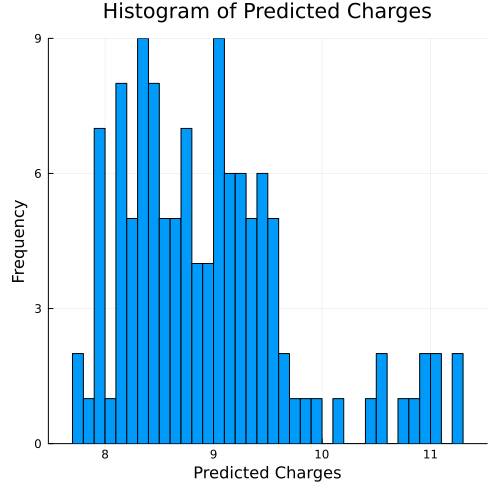

In [342]:
histogram(ypred_1, bins=50, xlabel="Predicted Charges", ylabel="Frequency", title="Histogram of Predicted Charges", legend=false)

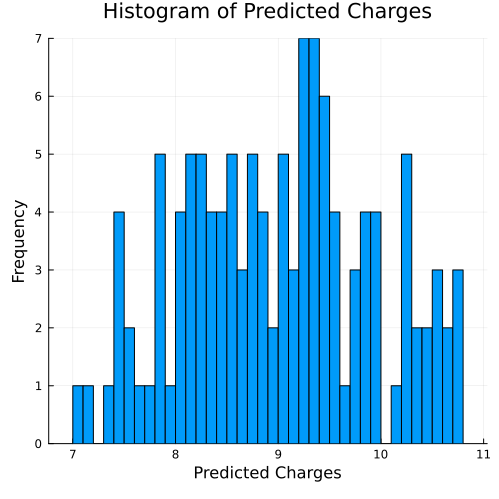

In [ ]:
histogram(yvalid, bins=50, xlabel="Predicted Charges", ylabel="Frequency", title="Histogram of Predicted Charges", legend=false)

In [343]:
msd(ypred_1, yvalid)

0.2635164911939795